In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import RMSprop
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import CSVLogger
from keras.models import load_model
import sklearn.metrics as metrics
import pandas as pd

Using TensorFlow backend.


In [ ]:
# DATA ACQUISITION

path = "../"

training_data_dir = path + "data/training" # 10633 * 2
validation_data_dir = path + "data/validation" # 1600 * 2
test_data_dir = path + "data/test" # 2000

# HYPERPARAMETERS
IMAGE_SIZE = 64
IMAGE_WIDTH, IMAGE_HEIGHT = IMAGE_SIZE, IMAGE_SIZE
EPOCHS = 20
BATCH_SIZE = 32
TEST_SIZE = 30

input_shape = (IMAGE_WIDTH, IMAGE_HEIGHT, 3)

In [2]:
# CLASSIFIER MODEL

model = Sequential()

model.add(Conv2D(8, 3, 3, border_mode='same', input_shape=input_shape, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(16, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, 3, 3, border_mode='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64, activation='relu')) #256
model.add(Dropout(0.5))

model.add(Dense(64, activation='relu')) #256
model.add(Dropout(0.5))

model.add(Dense(1))
model.add(Activation('sigmoid'))
    
model.compile(loss='binary_crossentropy',
            optimizer=RMSprop(lr=0.0001),
            metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(8, (3, 3), input_shape=(64, 64, 3..., activation="relu", padding="same")`
  after removing the cwd from sys.path.
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(16, (3, 3), activation="relu", padding="same")`
  import sys
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), activation="relu", padding="same")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\luron\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", padding="same")`
  del sys.path[0]


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [3]:
# DATA AUGMENTATION

training_data_generator = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
validation_data_generator = ImageDataGenerator(rescale=1./255)
test_data_generator = ImageDataGenerator(rescale=1./255)


# DATA PREPARATION

training_generator = training_data_generator.flow_from_directory(
    training_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")
validation_generator = validation_data_generator.flow_from_directory(
    validation_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")
test_generator = test_data_generator.flow_from_directory(
    test_data_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=1,
    class_mode="binary", 
    shuffle=False)


Found 21258 images belonging to 2 classes.
Found 3200 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [4]:
TRAINING_LOGS_FILE = "training_log_final.csv"
MODEL_SUMMARY_FILE = "model_summary_final.txt"
TEST_FILE = "test_file_final.csv"
MODEL_FILE = "model2-final.h5"

# TRAINING
model.fit_generator(
    training_generator,
    steps_per_epoch=len(training_generator.filenames) // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=len(validation_generator.filenames) // BATCH_SIZE,
    callbacks=[ CSVLogger(TRAINING_LOGS_FILE,
                                            append=False,
                                            separator=";")], 
    verbose=1)
model.save_weights(MODEL_FILE)
model.save('model2-final.h5')


Instructions for updating:
Use tf.cast instead.
Epoch 1/20
664/664 [==============================] - 257s 388ms/step - loss: 0.3330 - acc: 0.8565 - val_loss: 0.0666 - val_acc: 0.9812
Epoch 2/20
664/664 [==============================] - 243s 366ms/step - loss: 0.0656 - acc: 0.9827 - val_loss: 0.0473 - val_acc: 0.9819
Epoch 3/20
664/664 [==============================] - 229s 346ms/step - loss: 0.0405 - acc: 0.9897 - val_loss: 0.0420 - val_acc: 0.9831
Epoch 4/20
664/664 [==============================] - 245s 369ms/step - loss: 0.0300 - acc: 0.9920 - val_loss: 0.0389 - val_acc: 0.9934
Epoch 5/20
664/664 [==============================] - 248s 374ms/step - loss: 0.0218 - acc: 0.9944 - val_loss: 0.0325 - val_acc: 0.9878
Epoch 6/20
664/664 [==============================] - 247s 372ms/step - loss: 0.0161 - acc: 0.9955 - val_loss: 0.0292 - val_acc: 0.9956
Epoch 7/20
664/664 [==============================] - 247s 372ms/step - loss: 0.0128 - acc: 0.9960 - val_loss: 0.0230 - val_acc: 0.9959


## Showing original testing set

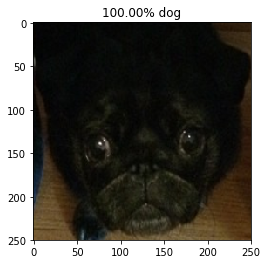

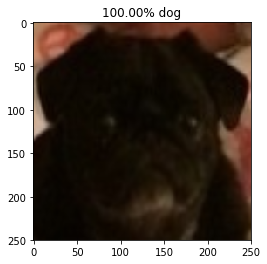

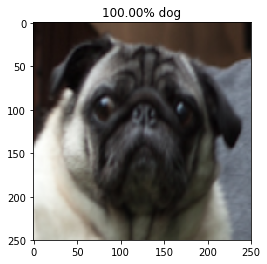

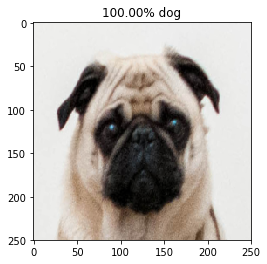

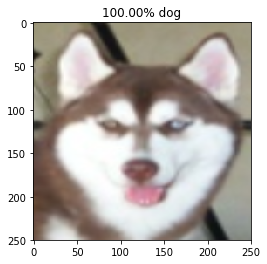

...

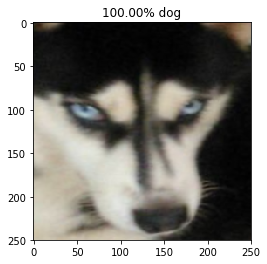

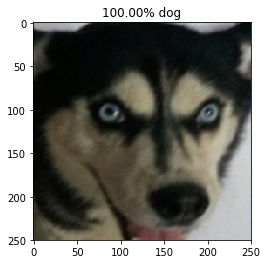

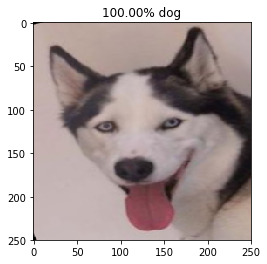

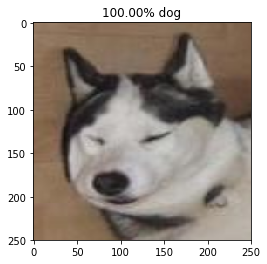

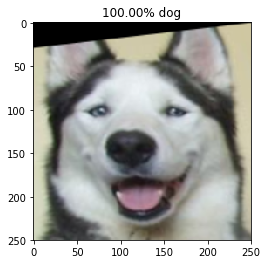

In [5]:
probabilities = model.predict_generator(test_generator, TEST_SIZE)


for index, probability in enumerate(probabilities):
    
    image_path = test_data_dir + "/" +test_generator.filenames[index]
    
    img = mpimg.imread(image_path)
    
    plt.imshow(img)
    
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% human")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% dog")
    
    plt.show()

## Testing with new shorter dataset

In [15]:
# Data augmentation
test_data_dir2 = "../data/test2" # 28
test_data_generator2 = ImageDataGenerator(rescale=1./255)

# Data preparation
test_generator2 = test_data_generator2.flow_from_directory(
    test_data_dir2,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=1,
    class_mode="binary", 
    
    shuffle=False)

Found 73 images belonging to 2 classes.


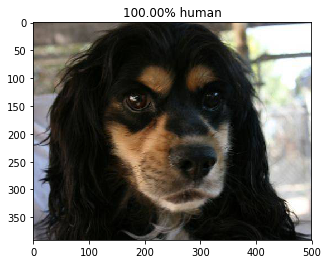

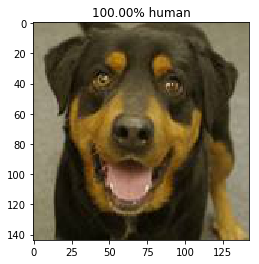

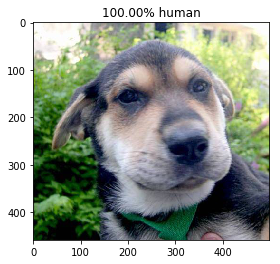

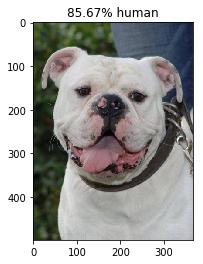

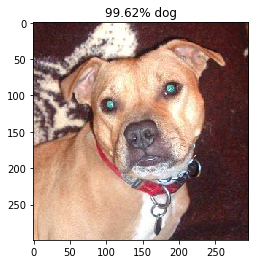

...

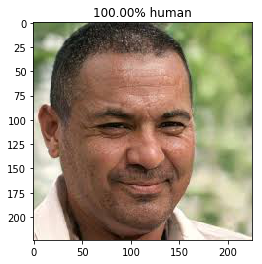

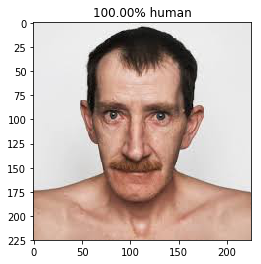

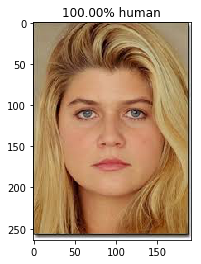

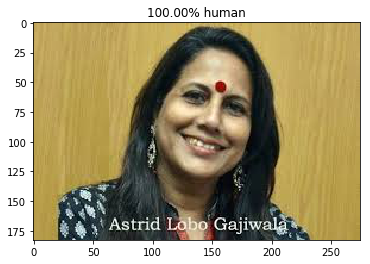

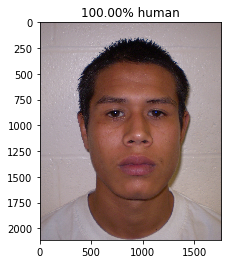

In [16]:
# Testing
probabilities2 = model.predict_generator(test_generator2, 73)

open(TEST_FILE,"w")
for index, probability in enumerate(probabilities2):
    
    image_path = test_data_dir2 + "/" +test_generator2.filenames[index]
    img = mpimg.imread(image_path)
    
    with open(TEST_FILE,"a") as fh:
        fh.write(str(probability[0]) +" "+ image_path + "\n")
        
    plt.imshow(img)
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% human")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% dog")
    plt.show()


In [17]:
df = pd.read_csv('test_file_final.csv')

In [18]:
df.head()

,prob,Unnamed: 1,Unnamed: 2
0,1.000000,../data/test2/dog\119.jpg,NaN
1,0.999994,../data/test2/dog\137.jpg,NaN
2,0.999992,../data/test2/dog\18.jpg,NaN
3,0.856720,../data/test2/dog\182.jpg,NaN
4,0.003841,../data/test2/dog\2.jpg,NaN


In [19]:
true_classes = test_generator2.classes
len(true_classes)

73

In [21]:
prob = df['prob']
predicted2 = []
for i in prob:
    if i <0.5:
        predicted2.append(0)
    else:
        predicted2.append(1)

In [24]:
df['pred'] = predicted2
df = df[['prob', 'pred']]

In [25]:
df.head()

,prob,pred
0,1.000000,1
1,0.999994,1
2,0.999992,1
3,0.856720,1
4,0.003841,0


In [26]:
df['true_c'] = true_classes

In [27]:
df.head()

,prob,pred,true_c
0,1.000000,1,0
1,0.999994,1,0
2,0.999992,1,0
3,0.856720,1,0
4,0.003841,0,0


In [28]:
report = metrics.classification_report(df['true_c'], df['pred'], target_names=['dog','human'])
print(report)

              precision    recall  f1-score   support

         dog       0.89      0.45      0.60        38
       human       0.61      0.94      0.74        35

   micro avg       0.68      0.68      0.68        73
   macro avg       0.75      0.70      0.67        73
weighted avg       0.76      0.68      0.67        73

